In [1]:
# prerequisite package imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sb

%matplotlib inline

# set up better resolution for figures
# matplotlib
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

# seaborn
sb.set(rc={"figure.dpi":300, 'savefig.dpi':300})
sb.set_context('notebook')
sb.set_style("ticks")

# for statistical test and annotation
from scipy import stats
from statsmodels.sandbox.stats.multicomp import multipletests

# CCLE

### 1. Read data

In [2]:
# check final output files
!ls ../output_raw

1_RefDNN_CCLE.csv              2_lococv_randomforest_CCLE.csv
1_RefDNN_CCLE_test.csv         2_lococv_randomforest_GDSC.csv
1_RefDNN_GDSC.csv              3_lodocv_RefDNN_CCLE.csv
1_elasticnet_CCLE.csv          3_lodocv_RefDNN_GDSC.csv
1_elasticnet_GDSC.csv          3_lodocv_elasticnet_CCLE.csv
1_randomforest_CCLE.csv        3_lodocv_elasticnet_GDSC.csv
1_randomforest_GDSC.csv        3_lodocv_randomforest_CCLE.csv
2_lococv_RefDNN_CCLE.csv       3_lodocv_randomforest_GDSC.csv
2_lococv_RefDNN_GDSC.csv       4_biomarker_CCLE.csv
2_lococv_elasticnet_CCLE.csv   4_biomarker_GDSC.csv
2_lococv_elasticnet_GDSC.csv


In [3]:
CCLE_RefDNN_LODOCV = pd.read_csv("../output_raw/3_lodocv_RefDNN_CCLE.csv", index_col=[0])
CCLE_RefDNN_LODOCV

,DRUGNAME,Train_size,Test_size,Accuracy,Precision,Recall,F1,AUCROC,AUCPR,Hidden_units,Learning_rate_ftrl,Learning_rate_adam,L1_regularization_strength,L2_regularization_strength
0,Erlotinib,5234,490,0.067347,0.000000,0.000000,0.000000,0.578808,0.952798,128,0.1,0.01453,100.0,0.001
1,Lapatinib,5233,491,0.103870,1.000000,0.013453,0.026549,0.575785,0.936774,128,0.1,0.01453,100.0,0.001
2,Nilotinib,5317,407,0.439803,0.982036,0.421594,0.589928,0.724364,0.978073,128,0.1,0.01453,100.0,0.001
3,Nutlin-3a (-),5233,491,1.000000,0.000000,0.000000,0.000000,-0.999000,NaN,128,0.1,0.01453,100.0,0.001
4,PD0325901,5233,491,0.348269,0.000000,0.000000,0.000000,0.803600,0.880784,128,0.1,0.01453,100.0,0.001
5,PHA-665752,5234,490,0.026531,1.000000,0.002092,0.004175,0.668410,0.984250,128,0.1,0.01453,100.0,0.001
6,PLX-4720,5241,483,1.000000,0.000000,0.000000,0.000000,-0.999000,NaN,128,0.1,0.01453,100.0,0.001
7,Paclitaxel,5234,490,0.889796,0.000000,0.000000,0.000000,0.598411,0.169373,128,0.1,0.01453,100.0,0.001
8,Palbociclib,5303,421,0.111639,0.000000,0.000000,0.000000,0.566447,0.917461,128,0.1,0.01453,100.0,0.001
9,Selumetinib,5234,490,0.589796,0.947644,0.486559,0.642984,0.823515,0.928801,128,0.1,0.01453,100.0,0.001


In [4]:
CCLE_elasticnet_LODOCV = pd.read_csv("../output_raw/3_lodocv_elasticnet_CCLE.csv", index_col=[0])
CCLE_elasticnet_LODOCV

,DRUGNAME,Train_size,Test_size,Accuracy,Precision,Recall,F1,AUCROC,AUCPR,ALPHA,L1_RATIO,ETA0
0,Erlotinib,5234,490,0.538776,0.929368,0.547046,0.688705,0.559180,0.955949,0.1,0.607952,0.000391
1,Lapatinib,5233,491,0.908350,0.908350,1.000000,0.951974,0.538515,0.924027,0.1,0.607952,0.000391
2,Nilotinib,5317,407,0.955774,0.955774,1.000000,0.977387,0.560054,0.967566,0.1,0.607952,0.000391
3,Nutlin-3a (-),5233,491,0.000000,0.000000,0.000000,0.000000,-0.999000,NaN,0.1,0.607952,0.000391
4,PD0325901,5233,491,0.651731,0.651731,1.000000,0.789149,0.636385,0.752667,0.1,0.607952,0.000391
5,PHA-665752,5234,490,0.936735,0.980645,0.953975,0.967126,0.678522,0.988541,0.1,0.607952,0.000391
6,PLX-4720,5241,483,0.000000,0.000000,0.000000,0.000000,-0.999000,NaN,0.1,0.607952,0.000391
7,Paclitaxel,5234,490,0.110204,0.110204,1.000000,0.198529,0.540477,0.154889,0.1,0.607952,0.000391
8,Palbociclib,5303,421,0.888361,0.888361,1.000000,0.940881,0.551143,0.908419,0.1,0.607952,0.000391
9,Selumetinib,5234,490,0.759184,0.759184,1.000000,0.863109,0.557830,0.792451,0.1,0.607952,0.000391


In [5]:
CCLE_randomforest_LODOCV = pd.read_csv("../output_raw/3_lodocv_randomforest_CCLE.csv", index_col=[0])
CCLE_randomforest_LODOCV

,DRUGNAME,Train_size,Test_size,Accuracy,Precision,Recall,F1,AUCROC,AUCPR,N_ESTIMTORS,MAX_DEPTH
0,Erlotinib,5234,490,0.867347,0.929825,0.927790,0.928806,0.662224,0.966350,53,3
1,Lapatinib,5233,491,0.871690,0.908316,0.955157,0.931148,0.614998,0.938274,53,3
2,Nilotinib,5317,407,0.931204,0.966408,0.961440,0.963918,0.725507,0.982522,53,3
3,Nutlin-3a (-),5233,491,0.004073,0.000000,0.000000,0.000000,-0.999000,NaN,53,3
4,PD0325901,5233,491,0.657841,0.657025,0.993750,0.791045,0.737701,0.846465,53,3
5,PHA-665752,5234,490,0.900000,0.982022,0.914226,0.946912,0.700837,0.986017,53,3
6,PLX-4720,5241,483,0.000000,0.000000,0.000000,0.000000,-0.999000,NaN,53,3
7,Paclitaxel,5234,490,0.116327,0.110883,1.000000,0.199630,0.602616,0.159337,53,3
8,Palbociclib,5303,421,0.855107,0.896203,0.946524,0.920676,0.631016,0.933002,53,3
9,Selumetinib,5234,490,0.767347,0.768750,0.991935,0.866197,0.762894,0.906153,53,3


### 2. Data wrangling and cleaning

In [6]:
#make the data tidy for visualization
CCLE_RefDNN_metrics = CCLE_RefDNN_LODOCV[['DRUGNAME', 'Accuracy', 'Precision', 'Recall', 'F1', 'AUCROC', 'AUCPR']]
CCLE_RefDNN_metrics_tidy = pd.melt(CCLE_RefDNN_metrics, id_vars=['DRUGNAME'], value_vars=list(CCLE_RefDNN_metrics)[1:], var_name='metric', value_name='value')
CCLE_RefDNN_metrics_tidy['model'] = 'RefDNN'

CCLE_elasticnet_metrics = CCLE_elasticnet_LODOCV[['DRUGNAME', 'Accuracy', 'Precision', 'Recall', 'F1', 'AUCROC', 'AUCPR']]
CCLE_elasticnet_metrics_tidy = pd.melt(CCLE_elasticnet_metrics, id_vars=['DRUGNAME'], value_vars=list(CCLE_elasticnet_metrics)[1:], var_name='metric', value_name='value')
CCLE_elasticnet_metrics_tidy['model'] = 'Elastic Net'

CCLE_randomforest_metrics = CCLE_randomforest_LODOCV[['DRUGNAME', 'Accuracy', 'Precision', 'Recall', 'F1', 'AUCROC', 'AUCPR']]
CCLE_randomforest_metrics_tidy = pd.melt(CCLE_randomforest_metrics, id_vars=['DRUGNAME'], value_vars=list(CCLE_randomforest_metrics)[1:], var_name='metric', value_name='value')
CCLE_randomforest_metrics_tidy['model'] = 'Random Forest'

CCLE_metrics_tidy = pd.concat([CCLE_RefDNN_metrics_tidy, CCLE_elasticnet_metrics_tidy, CCLE_randomforest_metrics_tidy], ignore_index=True)

CCLE_metrics_tidy = CCLE_metrics_tidy[~pd.isna(CCLE_metrics_tidy['value'])]
CCLE_metrics_tidy = CCLE_metrics_tidy[CCLE_metrics_tidy['value'] > 0]
CCLE_metrics_tidy = CCLE_metrics_tidy.reset_index(drop=True)
CCLE_metrics_tidy

,DRUGNAME,metric,value,model
0,Erlotinib,Accuracy,0.067347,RefDNN
1,Lapatinib,Accuracy,0.103870,RefDNN
2,Nilotinib,Accuracy,0.439803,RefDNN
3,Nutlin-3a (-),Accuracy,1.000000,RefDNN
4,PD0325901,Accuracy,0.348269,RefDNN
...,...,...,...,...
160,Paclitaxel,AUCPR,0.159337,Random Forest
161,Palbociclib,AUCPR,0.933002,Random Forest
162,Selumetinib,AUCPR,0.906153,Random Forest
163,Sorafenib,AUCPR,0.964100,Random Forest


### 3. A quick visualization

In [7]:
models = ['RefDNN', 'Random Forest', 'Elastic Net']
metrics = ['Accuracy', 'AUCROC', 'Precision', 'Recall', 'F1', 'AUCPR']
CCLE_metrics_tidy['model'] = pd.Categorical(CCLE_metrics_tidy['model'],
                                   categories=models,
                                   ordered=True)

In [8]:
def plot_data(metric, dataset='GDSC'):
    if dataset=='CCLE':
        data_tidy = CCLE_metrics_tidy
    if dataset=='GDSC':
        data_tidy = GDSC_metrics_tidy
    data = data_tidy[data_tidy['metric']==metric].drop(columns='metric').reset_index(drop=True)
    sb.lineplot(data=data, x='model', y='value', hue='DRUGNAME', legend=False, alpha = 0.5, palette={sb.color_palette("Greys")[1]}); #
    sb.boxplot(data=data, x='model', y='value',  boxprops=dict(alpha=1));
    sb.stripplot(data=data, x='model', y='value', color = 'black', alpha = 0.5, jitter=False)
    plt.ylim(0, 1.1)
    plt.xlabel('')
    plt.ylabel(f'LODOCV {metric} on {dataset} data');

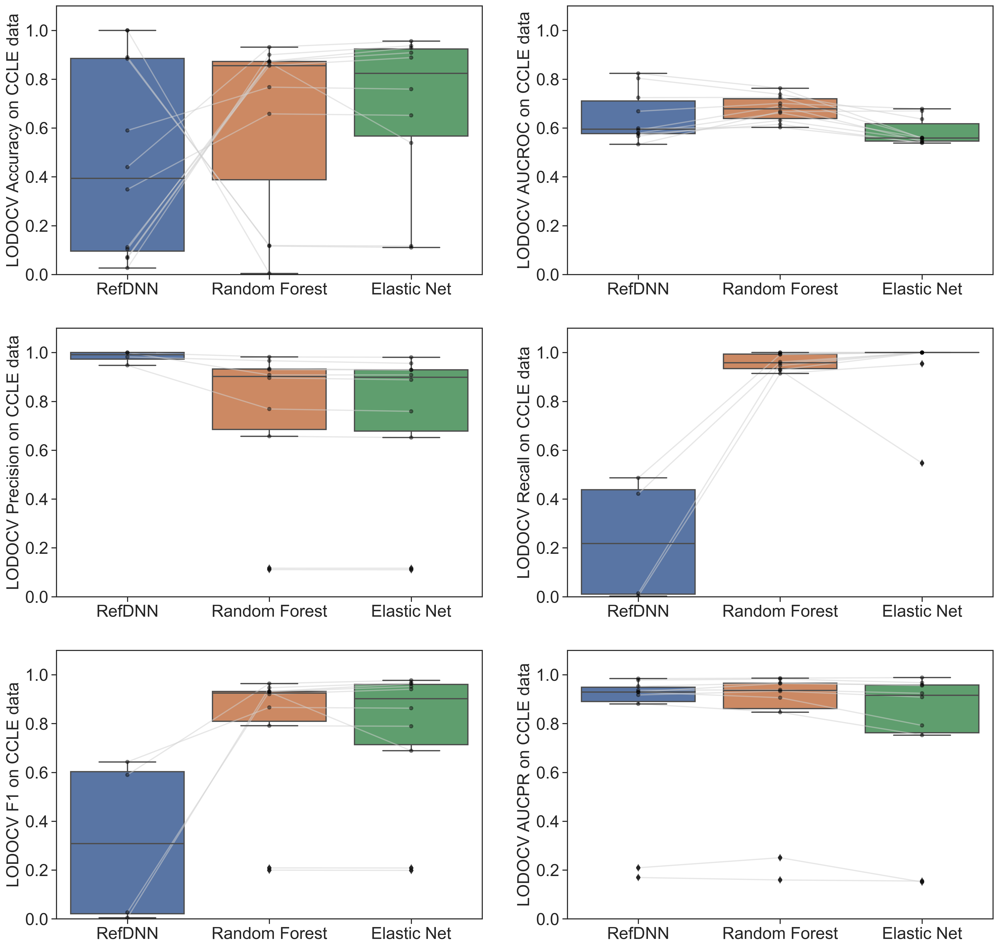

In [9]:
params = {
   'axes.labelsize': 20,
   'font.size': 20,
   'legend.fontsize': 20,
   'xtick.labelsize': 20,
   'ytick.labelsize': 20,
   'text.usetex': False,
   'figure.figsize': [20,20]
   }
rcParams.update(params)

for i, metric in enumerate(metrics):
    plt.subplot(3,2,i+1)
    plot_data(metric, 'CCLE')


### 4. Statistical test

In [10]:
p_values_df_CCLE = pd.DataFrame()
p_values_df_CCLE['metric'] = metrics
p_values_rf, p_values_en = [], []

# remove some drugs here because it has some 0 values in some metrics, causing problem with the paired Wilcoxon test
CCLE_metrics_tidy = CCLE_metrics_tidy[~CCLE_metrics_tidy['DRUGNAME'].isin(['Nutlin-3a (-)', 'PLX-4720'])]

for metric in metrics:
    if metric in ['Precision', 'Recall', 'F1']: # RefDNN only has 4 valid values for some metrics
        p_values_rf.append('na')
        p_values_en.append('na')
        continue
    
    refDNN_values = list(CCLE_metrics_tidy[(CCLE_metrics_tidy['metric']==metric) & (CCLE_metrics_tidy['model']=='RefDNN')]['value'])
    rf_values = list(CCLE_metrics_tidy[(CCLE_metrics_tidy['metric']==metric) & (CCLE_metrics_tidy['model']=='Random Forest')]['value'])
    en_values = list(CCLE_metrics_tidy[(CCLE_metrics_tidy['metric']==metric) & (CCLE_metrics_tidy['model']=='Elastic Net')]['value'])
    # print(metric, len(refDNN_values), len(rf_values), len(en_values)) 
    p_values_rf.append(stats.wilcoxon(refDNN_values, rf_values, mode='approx')[1])
    p_values_en.append(stats.wilcoxon(refDNN_values, en_values, mode='approx')[1])
    
p_values_df_CCLE['Random Forest'] = p_values_rf
p_values_df_CCLE['Elastic Net'] = p_values_en
p_values_df_CCLE

,metric,Random Forest,Elastic Net
0,Accuracy,0.114128,0.114128
1,AUCROC,0.114128,0.046853
2,Precision,na,na
3,Recall,na,na
4,F1,na,na
5,AUCPR,0.444587,0.074462


None of these will stay significant after Bonferroni correction.

In [11]:
temp = p_values_df_CCLE[(p_values_df_CCLE['Random Forest'] != 'na') & (p_values_df_CCLE['Elastic Net'] != 'na')]
p_adjusted = multipletests(list(temp['Random Forest']) + list(temp['Elastic Net']), 
                           alpha=0.05, method='bonferroni', is_sorted=False, returnsorted=False)
temp['Random Forest adjusted'] = p_adjusted[1][0:3]
temp['Elastic Net adjusted'] = p_adjusted[1][3:]
p_values_df_CCLE = pd.merge(p_values_df_CCLE, temp, how='left')
p_values_df_CCLE

/var/folders/6t/dfz64ccs4vd95l2k0ff02638v9nvwr/T/ipykernel_17051/257251194.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp['Random Forest adjusted'] = p_adjusted[1][0:3]
/var/folders/6t/dfz64ccs4vd95l2k0ff02638v9nvwr/T/ipykernel_17051/257251194.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp['Elastic Net adjusted'] = p_adjusted[1][3:]


,metric,Random Forest,Elastic Net,Random Forest adjusted,Elastic Net adjusted
0,Accuracy,0.114128,0.114128,0.68477,0.684770
1,AUCROC,0.114128,0.046853,0.68477,0.281120
2,Precision,na,na,NaN,NaN
3,Recall,na,na,NaN,NaN
4,F1,na,na,NaN,NaN
5,AUCPR,0.444587,0.074462,1.00000,0.446771


In [12]:
p_values_df_CCLE['Random Forest Labels'] = p_values_df_CCLE['Random Forest adjusted'].apply(lambda p: 'na' if pd.isna(p) else('**' if p<0.01 else('*' if p<0.05 else 'ns')))
p_values_df_CCLE['Elastic Net Labels'] = p_values_df_CCLE['Elastic Net adjusted'].apply(lambda p: 'na' if pd.isna(p) else('**' if p<0.01 else('*' if p<0.05 else 'ns')))
p_values_df_CCLE

,metric,Random Forest,Elastic Net,Random Forest adjusted,Elastic Net adjusted,Random Forest Labels,Elastic Net Labels
0,Accuracy,0.114128,0.114128,0.68477,0.684770,ns,ns
1,AUCROC,0.114128,0.046853,0.68477,0.281120,ns,ns
2,Precision,na,na,NaN,NaN,na,na
3,Recall,na,na,NaN,NaN,na,na
4,F1,na,na,NaN,NaN,na,na
5,AUCPR,0.444587,0.074462,1.00000,0.446771,ns,ns


# GDSC

### 1. Read data

In [13]:
GDSC_RefDNN_LODOCV = pd.read_csv("../output_raw/3_lodocv_RefDNN_GDSC.csv", index_col=[0])
GDSC_RefDNN_LODOCV

,DRUGNAME,Train_size,Test_size,Accuracy,Precision,Recall,F1,AUCROC,AUCPR,Hidden_units,Learning_rate_ftrl,Learning_rate_adam,L1_regularization_strength,L2_regularization_strength
0,(5Z)-7-Oxozeaenol,189118,918,0.187364,0.108852,0.989130,0.196121,0.797255,0.364718,49,0.000008,0.000407,0.001,66.751654
1,5-Fluorouracil,189122,914,0.459519,0.000000,0.000000,0.000000,0.809370,0.803320,49,0.000008,0.000407,0.001,66.751654
2,A-443654,189638,398,0.258794,0.245524,1.000000,0.394251,0.686017,0.399870,49,0.000008,0.000407,0.001,66.751654
3,A-770041,189637,399,0.641604,0.707407,0.749020,0.727619,0.648856,0.771734,49,0.000008,0.000407,0.001,66.751654
4,AICA Ribonucleotide,189196,840,0.580952,0.685430,0.446121,0.540470,0.674345,0.703671,49,0.000008,0.000407,0.001,66.751654
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217,YM201636,189116,920,0.653261,0.878935,0.574367,0.694737,0.797309,0.873084,49,0.000008,0.000407,0.001,66.751654
218,Z-LLNle-CHO,189638,398,0.670854,1.000000,0.096552,0.176101,0.750007,0.643545,49,0.000008,0.000407,0.001,66.751654
219,ZM447439,189235,801,0.766542,0.763469,0.988095,0.861379,0.759637,0.893507,49,0.000008,0.000407,0.001,66.751654
220,ZSTK474,189114,922,0.598698,0.323529,0.762376,0.454277,0.733732,0.433868,49,0.000008,0.000407,0.001,66.751654


In [14]:
GDSC_elasticnet_LODOCV = pd.read_csv("../output_raw/3_lodocv_elasticnet_GDSC.csv", index_col=[0])
GDSC_elasticnet_LODOCV

,DRUGNAME,Train_size,Test_size,Accuracy,Precision,Recall,F1,AUCROC,AUCPR,ALPHA,L1_RATIO,ETA0
0,(5Z)-7-Oxozeaenol,189118,918,0.101307,0.100327,1.000000,0.182359,0.681085,0.233934,0.010197,0.439733,0.021812
1,5-Fluorouracil,189122,914,0.671772,0.638571,0.904858,0.748744,0.722296,0.734772,0.010197,0.439733,0.021812
2,A-443654,189638,398,0.241206,0.241206,1.000000,0.388664,0.620171,0.309811,0.010197,0.439733,0.021812
3,A-770041,189637,399,0.634085,0.660767,0.878431,0.754209,0.600109,0.728769,0.010197,0.439733,0.021812
4,AICA Ribonucleotide,189196,840,0.647619,0.618644,0.943966,0.747440,0.684898,0.667526,0.010197,0.439733,0.021812
...,...,...,...,...,...,...,...,...,...,...,...,...
217,YM201636,189116,920,0.733696,0.725262,0.985759,0.835681,0.738149,0.830780,0.010197,0.439733,0.021812
218,Z-LLNle-CHO,189638,398,0.376884,0.368957,1.000000,0.539033,0.678915,0.541988,0.010197,0.439733,0.021812
219,ZM447439,189235,801,0.757803,0.793155,0.906463,0.846032,0.708832,0.850305,0.010197,0.439733,0.021812
220,ZSTK474,189114,922,0.777657,0.400000,0.029703,0.055300,0.656993,0.324269,0.010197,0.439733,0.021812


In [15]:
GDSC_randomforest_LODOCV = pd.read_csv("../output_raw/3_lodocv_randomforest_GDSC.csv", index_col=[0])
GDSC_randomforest_LODOCV

,DRUGNAME,Train_size,Test_size,Accuracy,Precision,Recall,F1,AUCROC,AUCPR,N_ESTIMTORS,MAX_DEPTH
0,(5Z)-7-Oxozeaenol,189118,918,0.160131,0.105691,0.989130,0.190976,0.791136,0.366223,51,7
1,5-Fluorouracil,189122,914,0.599562,0.575472,0.987854,0.727273,0.802477,0.784710,51,7
2,A-443654,189638,398,0.399497,0.285285,0.989583,0.442890,0.724890,0.419847,51,7
3,A-770041,189637,399,0.666667,0.680473,0.901961,0.775717,0.673230,0.793709,51,7
4,AICA Ribonucleotide,189196,840,0.617857,0.591549,0.995690,0.742169,0.694814,0.712991,51,7
...,...,...,...,...,...,...,...,...,...,...,...
217,YM201636,189116,920,0.736957,0.727804,0.985759,0.837366,0.789760,0.869525,51,7
218,Z-LLNle-CHO,189638,398,0.492462,0.415430,0.965517,0.580913,0.780183,0.690960,51,7
219,ZM447439,189235,801,0.767790,0.773842,0.965986,0.859304,0.732602,0.869891,51,7
220,ZSTK474,189114,922,0.284165,0.234339,1.000000,0.379699,0.738724,0.439982,51,7


### 2. Data wrangling and cleaning

In [16]:
# make the data tidy for visualization
GDSC_RefDNN_metrics = GDSC_RefDNN_LODOCV[['DRUGNAME', 'Accuracy', 'Precision', 'Recall', 'F1', 'AUCROC', 'AUCPR']]
GDSC_RefDNN_metrics_tidy = pd.melt(GDSC_RefDNN_metrics, id_vars=['DRUGNAME'], value_vars=list(GDSC_RefDNN_metrics)[1:], var_name='metric', value_name='value')
GDSC_RefDNN_metrics_tidy['model'] = 'RefDNN'

GDSC_elasticnet_metrics = GDSC_elasticnet_LODOCV[['DRUGNAME', 'Accuracy', 'Precision', 'Recall', 'F1', 'AUCROC', 'AUCPR']]
GDSC_elasticnet_metrics_tidy = pd.melt(GDSC_elasticnet_metrics, id_vars=['DRUGNAME'], value_vars=list(GDSC_elasticnet_metrics)[1:], var_name='metric', value_name='value')
GDSC_elasticnet_metrics_tidy['model'] = 'Elastic Net'

GDSC_randomforest_metrics = GDSC_randomforest_LODOCV[['DRUGNAME', 'Accuracy', 'Precision', 'Recall', 'F1', 'AUCROC', 'AUCPR']]
GDSC_randomforest_metrics_tidy = pd.melt(GDSC_randomforest_metrics, id_vars=['DRUGNAME'], value_vars=list(GDSC_randomforest_metrics)[1:], var_name='metric', value_name='value')
GDSC_randomforest_metrics_tidy['model'] = 'Random Forest'

GDSC_metrics_tidy = pd.concat([GDSC_RefDNN_metrics_tidy, GDSC_elasticnet_metrics_tidy, GDSC_randomforest_metrics_tidy], ignore_index=True)

GDSC_metrics_tidy = GDSC_metrics_tidy[~pd.isna(GDSC_metrics_tidy['value'])]
GDSC_metrics_tidy = GDSC_metrics_tidy[GDSC_metrics_tidy['value'] > 0]
GDSC_metrics_tidy = GDSC_metrics_tidy.reset_index(drop=True)
GDSC_metrics_tidy

,DRUGNAME,metric,value,model
0,(5Z)-7-Oxozeaenol,Accuracy,0.187364,RefDNN
1,5-Fluorouracil,Accuracy,0.459519,RefDNN
2,A-443654,Accuracy,0.258794,RefDNN
3,A-770041,Accuracy,0.641604,RefDNN
4,AICA Ribonucleotide,Accuracy,0.580952,RefDNN
...,...,...,...,...
3961,YM201636,AUCPR,0.869525,Random Forest
3962,Z-LLNle-CHO,AUCPR,0.690960,Random Forest
3963,ZM447439,AUCPR,0.869891,Random Forest
3964,ZSTK474,AUCPR,0.439982,Random Forest


### 3. A quick visualization

In [17]:
models = ['RefDNN', 'Random Forest', 'Elastic Net']
metrics = ['Accuracy', 'AUCROC', 'Precision', 'Recall', 'F1', 'AUCPR']
GDSC_metrics_tidy['model'] = pd.Categorical(GDSC_metrics_tidy['model'],
                                   categories=models,
                                   ordered=True)

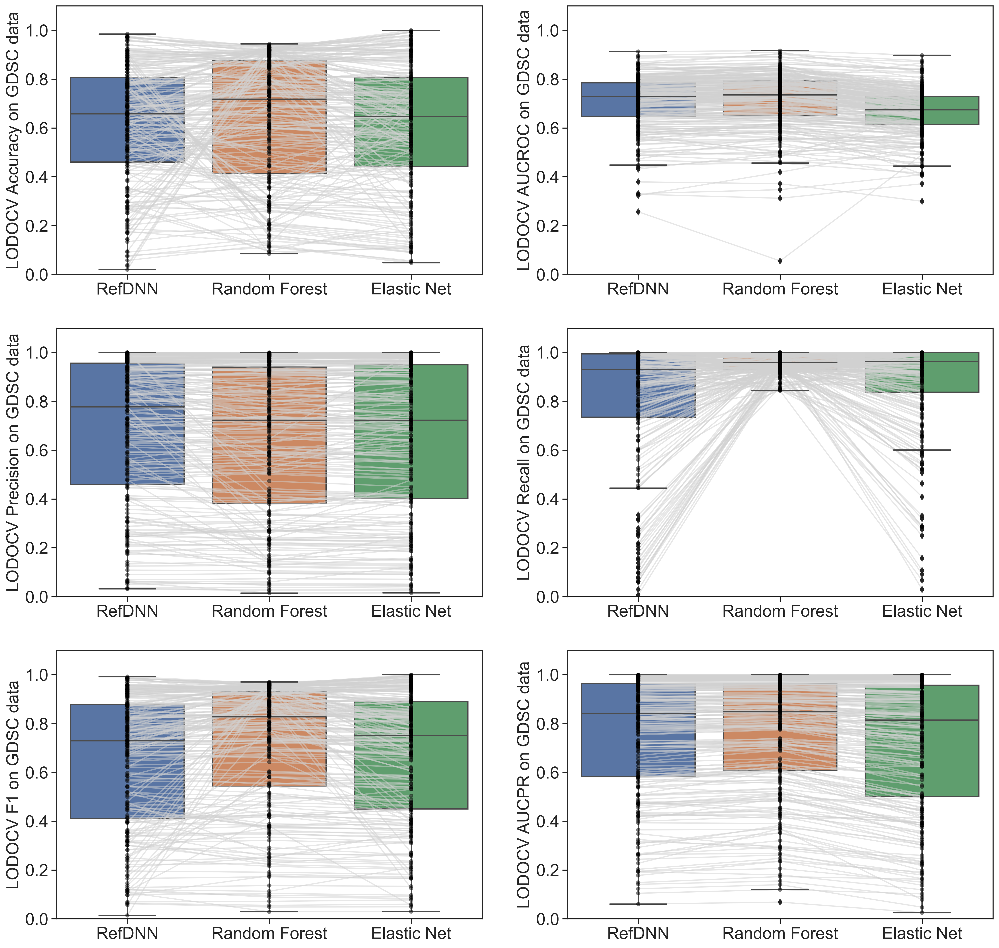

In [18]:
params = {
   'axes.labelsize': 20,
   'font.size': 20,
   'legend.fontsize': 20,
   'xtick.labelsize': 20,
   'ytick.labelsize': 20,
   'text.usetex': False,
   'figure.figsize': [20,20]
   }
rcParams.update(params)

for i, metric in enumerate(metrics):
    plt.subplot(3,2,i+1)
    plot_data(metric, 'GDSC')


### 4. Some additional processing of data

In [19]:
# for a certain metric, we can reshape the dataframe
metric = 'AUCROC'
temp = GDSC_metrics_tidy[(GDSC_metrics_tidy['metric']==metric)].drop(columns='metric')
temp = temp.pivot(index='DRUGNAME', columns='model', values='value')

In [20]:
# we can combine the drug target information and save the AUCROC values here:
drug_target = pd.read_csv('../analysis_output/drug_target.csv')
drug_target_AUCROC = pd.merge(drug_target, temp, how='left', left_on='Drug', right_on='DRUGNAME').sort_values(
    by='RefDNN', ascending=False).reset_index(drop=True)
drug_target_AUCROC.to_csv('../analysis_output/drug_LODOCV_AUCROC.csv')

In [21]:
drug_target_AUCROC[drug_target_AUCROC['Drug']=='Palbociclib']

,Drug,Target pathway,RefDNN,Random Forest,Elastic Net
137,Palbociclib,Cell cycle,0.690943,0.697162,0.61487


In [22]:
# for statistical analysis, we also need to remove the drugs that we might be missing some data
temp = temp[~(pd.isna(temp['RefDNN']) | pd.isna(temp['Random Forest']) | pd.isna(temp['Elastic Net']))]
temp

model,RefDNN,Random Forest,Elastic Net
DRUGNAME,,,
(5Z)-7-Oxozeaenol,0.797255,0.791136,0.681085
5-Fluorouracil,0.809370,0.802477,0.722296
A-443654,0.686017,0.724890,0.620171
A-770041,0.648856,0.673230,0.600109
AICA Ribonucleotide,0.674345,0.694814,0.684898
...,...,...,...
YM201636,0.797309,0.789760,0.738149
Z-LLNle-CHO,0.750007,0.780183,0.678915
ZM447439,0.759637,0.732602,0.708832


### 5. Statistical test

In [23]:
p_values_df_GDSC = pd.DataFrame()
p_values_df_GDSC['metric'] = metrics
p_values_rf, p_values_en = [], []

for metric in metrics:
    temp = GDSC_metrics_tidy[(GDSC_metrics_tidy['metric']==metric)].drop(columns='metric')
    temp = temp.pivot(index='DRUGNAME', columns='model', values='value')
    temp = temp[~(pd.isna(temp['RefDNN']) | pd.isna(temp['Random Forest']) | pd.isna(temp['Elastic Net']))]
    p_values_rf.append(stats.wilcoxon(list(temp['RefDNN']), list(temp['Random Forest']), mode='approx')[1])
    p_values_en.append(stats.wilcoxon(list(temp['RefDNN']), list(temp['Elastic Net']), mode='approx')[1])

p_values_df_GDSC['Random Forest'] = p_values_rf
p_values_df_GDSC['Elastic Net'] = p_values_en
p_values_df_GDSC

,metric,Random Forest,Elastic Net
0,Accuracy,3.201590e-02,3.074997e-01
1,AUCROC,3.352514e-11,3.832212e-29
2,Precision,8.135226e-04,2.709717e-05
3,Recall,1.877645e-12,3.325277e-03
4,F1,2.563580e-07,9.263465e-01
5,AUCPR,1.345026e-08,3.832212e-29


In [24]:
p_adjusted = multipletests(list(p_values_df_GDSC['Random Forest']) + list(p_values_df_GDSC['Elastic Net']), 
                           alpha=0.05, method='bonferroni', is_sorted=False, returnsorted=False)
p_values_df_GDSC['Random Forest adjusted'] = p_adjusted[1][0:6]
p_values_df_GDSC['Elastic Net adjusted'] = p_adjusted[1][6:]
p_values_df_GDSC

,metric,Random Forest,Elastic Net,Random Forest adjusted,Elastic Net adjusted
0,Accuracy,3.201590e-02,3.074997e-01,3.841908e-01,1.000000e+00
1,AUCROC,3.352514e-11,3.832212e-29,4.023017e-10,4.598654e-28
2,Precision,8.135226e-04,2.709717e-05,9.762271e-03,3.251660e-04
3,Recall,1.877645e-12,3.325277e-03,2.253173e-11,3.990332e-02
4,F1,2.563580e-07,9.263465e-01,3.076296e-06,1.000000e+00
5,AUCPR,1.345026e-08,3.832212e-29,1.614031e-07,4.598654e-28


In [25]:
p_values_df_GDSC['Random Forest Labels'] = p_values_df_GDSC['Random Forest adjusted'].apply(lambda p: '**' if p<0.01 else('*' if p<0.05 else 'ns'))
p_values_df_GDSC['Elastic Net Labels'] = p_values_df_GDSC['Elastic Net adjusted'].apply(lambda p: '**' if p<0.01 else('*' if p<0.05 else 'ns'))
p_values_df_GDSC

,metric,Random Forest,Elastic Net,Random Forest adjusted,Elastic Net adjusted,Random Forest Labels,Elastic Net Labels
0,Accuracy,3.201590e-02,3.074997e-01,3.841908e-01,1.000000e+00,ns,ns
1,AUCROC,3.352514e-11,3.832212e-29,4.023017e-10,4.598654e-28,**,**
2,Precision,8.135226e-04,2.709717e-05,9.762271e-03,3.251660e-04,**,**
3,Recall,1.877645e-12,3.325277e-03,2.253173e-11,3.990332e-02,**,*
4,F1,2.563580e-07,9.263465e-01,3.076296e-06,1.000000e+00,**,ns
5,AUCPR,1.345026e-08,3.832212e-29,1.614031e-07,4.598654e-28,**,**


# Additional analysis of the drugs

In [26]:
drug_target_AUCROC

,Drug,Target pathway,RefDNN,Random Forest,Elastic Net
0,OSI-930,RTK signaling,0.913096,0.916813,0.897808
1,T0901317,Other,0.896238,0.910142,0.828218
2,KIN001-270,Cell cycle,0.893177,0.890681,0.870676
3,Obatoclax Mesylate,Apoptosis regulation,0.886552,0.891884,0.802962
4,Tivozanib,RTK signaling,0.864595,0.880308,0.837082
...,...,...,...,...,...
217,SGC0946,Chromatin histone methylation,0.328571,0.312088,0.371429
218,SL0101,Other,0.323618,0.418870,0.524639
219,Zibotentan,Other,0.256801,0.055495,0.490751
220,UNC1215,Chromatin other,NaN,NaN,NaN


In [27]:
pathway_AUCROC = drug_target_AUCROC[~pd.isna(drug_target_AUCROC['RefDNN'])][['Target pathway', 'RefDNN']]
pathway_AUCROC

,Target pathway,RefDNN
0,RTK signaling,0.913096
1,Other,0.896238
2,Cell cycle,0.893177
3,Apoptosis regulation,0.886552
4,RTK signaling,0.864595
...,...,...
215,EGFR signaling,0.379177
216,EGFR signaling,0.331429
217,Chromatin histone methylation,0.328571
218,Other,0.323618


In [28]:
# generate order for the categories:
grouped = pathway_AUCROC.loc[:,['Target pathway', 'RefDNN']].groupby(
    ['Target pathway']).median().sort_values(by='RefDNN', ascending=False)
grouped

,RefDNN
Target pathway,
ABL signaling,0.857476
DNA replication,0.792604
"Other, kinases",0.769134
Genome integrity,0.767327
Mitosis,0.759637
Cell cycle,0.749287
Chromatin histone acetylation,0.740828
Other,0.739028
Apoptosis regulation,0.732875


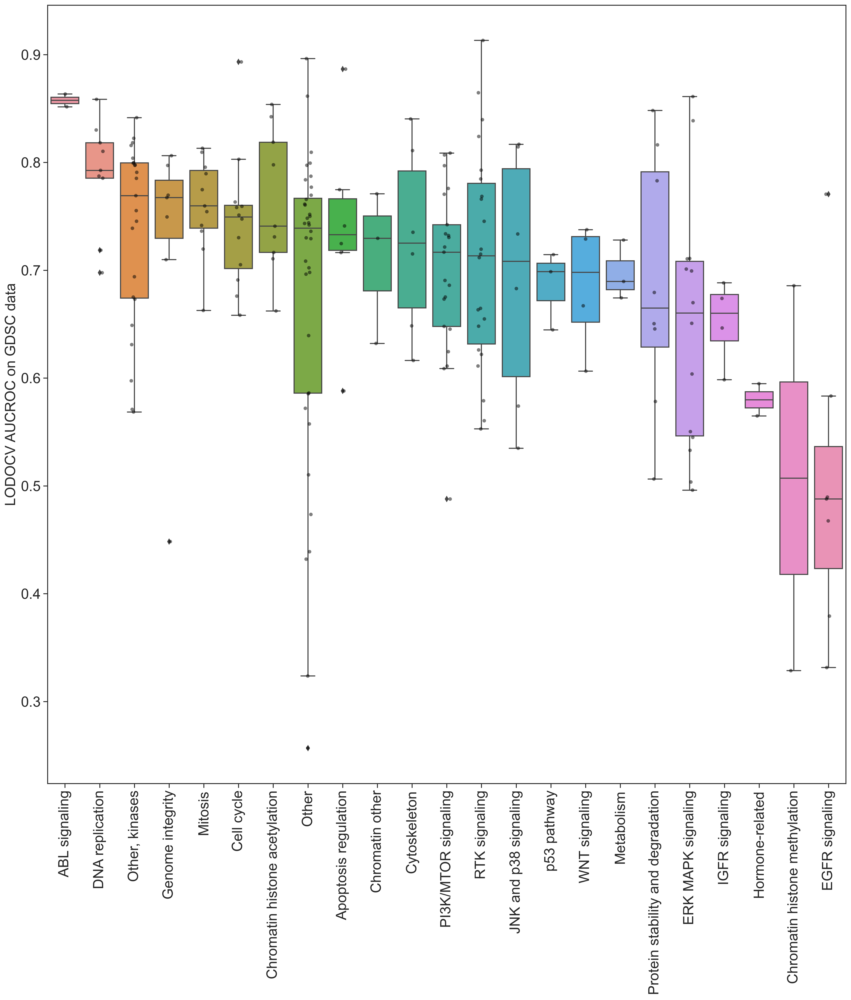

In [29]:
sb.boxplot(data=pathway_AUCROC, x='Target pathway', y='RefDNN', order=grouped.index);
sb.stripplot(data=pathway_AUCROC, x='Target pathway', y='RefDNN', order=grouped.index, color = 'black', alpha = 0.5)
plt.xlabel('')
plt.xticks(rotation=90)
plt.ylabel(f'LODOCV AUCROC on GDSC data');

Some intresting drug categories on the higher predictivity side:
- ABL: GNF-2, Nilotinib  
- Cell cycle: KIN001-270  
- Apoptosis: Obatoclax Mesylate  
- DNA replication: Temozolomide  

# Prepare the final figure for the report

In [30]:
p_values = {'CCLE': p_values_df_CCLE[['metric', 'Random Forest Labels', 'Elastic Net Labels']].rename(
                columns={'Random Forest Labels':'rf', 'Elastic Net Labels':'en'}).set_index('metric'), 
            'GDSC': p_values_df_GDSC[['metric', 'Random Forest Labels', 'Elastic Net Labels']].rename(
                columns={'Random Forest Labels':'rf', 'Elastic Net Labels':'en'}).set_index('metric')}

In [31]:
def plot_data_final(metric, dataset, figure_num):
    if dataset=='CCLE':
        data_tidy = CCLE_metrics_tidy
    if dataset=='GDSC':
        data_tidy = GDSC_metrics_tidy
    data = data_tidy[data_tidy['metric']==metric].drop(columns='metric').reset_index(drop=True)
    sb.lineplot(data=data, x='model', y='value', hue='DRUGNAME', legend=False, alpha = 0.5, palette={sb.color_palette("Greys")[1]}); #
    sb.boxplot(data=data, x='model', y='value',  boxprops=dict(alpha=1), flierprops = dict(markerfacecolor = '0.50', markersize = 1.5));
    sb.stripplot(data=data, x='model', y='value', color = 'black', alpha = 0.3, jitter=False)
    plt.ylim(0, 1.1)
    plt.xlabel('')
    plt.xticks(rotation=45)
    
    rf_p = p_values[dataset].loc[metric, 'rf']
    en_p = p_values[dataset].loc[metric, 'en']
    rf_w_p_value = 'Random Forest' + (rf_p if '*' in rf_p else '')
    en_w_p_value = 'Elastic Net' + (en_p if '*' in en_p else '')
    plt.xticks([0,1,2],['RefDNN', rf_w_p_value, en_w_p_value]);
    
    plt.ylabel(f'LODOCV {metric} ({dataset})');
    panel_labels = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H']
    plt.annotate(panel_labels[figure_num-1], weight='bold', xy=(0, 1), xycoords='axes fraction', xytext=(-85, 25), textcoords='offset points',
                 horizontalalignment='left', verticalalignment='top')

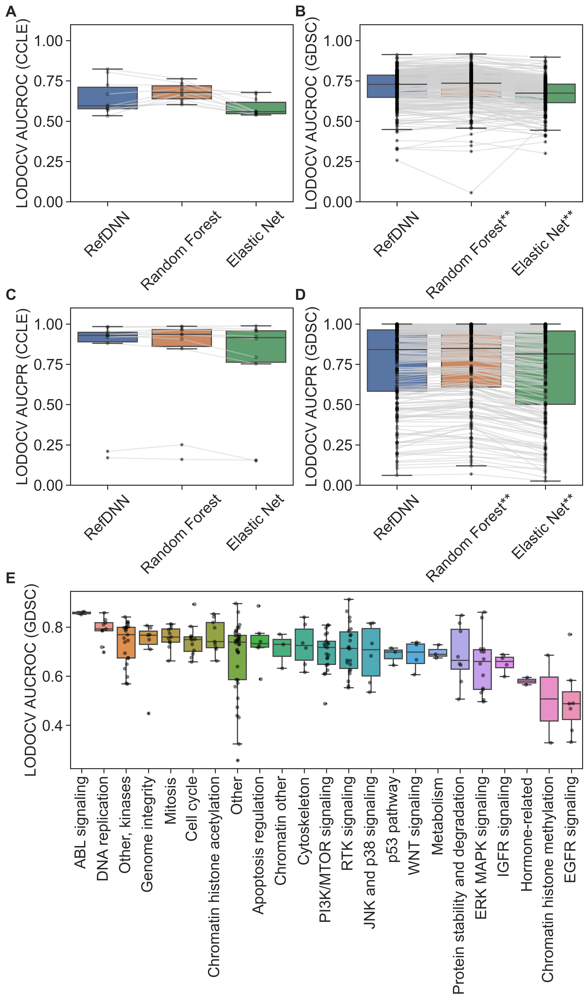

In [32]:
params = {
   'axes.labelsize': 20,
   'font.size': 20,
   'legend.fontsize': 20,
   'xtick.labelsize': 20,
   'ytick.labelsize': 20,
   'text.usetex': False,
   'figure.figsize': [12,18]
   }
rcParams.update(params)
plt.subplots_adjust(left=0.125, bottom=0.05, right=0.9, top=0.8, wspace=0.3, hspace=0.6)

plt.subplot(3,2,1)
plot_data_final('AUCROC', 'CCLE', 1)
plt.subplot(3,2,2)
plot_data_final('AUCROC', 'GDSC', 2)
plt.subplot(3,2,3)
plot_data_final('AUCPR', 'CCLE', 3)
plt.subplot(3,2,4)
plot_data_final('AUCPR', 'GDSC', 4)

plt.subplot(3,1,3)
sb.boxplot(data=pathway_AUCROC, x='Target pathway', y='RefDNN', order=grouped.index, 
           flierprops = dict(markerfacecolor = '0.50', markersize = 1.5));
sb.stripplot(data=pathway_AUCROC, x='Target pathway', y='RefDNN', order=grouped.index, color = 'black', alpha = 0.5);
plt.xlabel('');
plt.xticks(rotation=90);
plt.ylabel(f'LODOCV AUCROC (GDSC)');
plt.annotate('E', weight='bold', xy=(0, 1), xycoords='axes fraction', xytext=(-85, 25), textcoords='offset points',
             horizontalalignment='left', verticalalignment='top');

plt.savefig("analysis_output/figure3_LODOCV.png", bbox_inches='tight');